## purpose: check prediction result in the map.

In [1]:
import sys
sys.path.append("..")

import os
import json
import glob
import cv2
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import plotly.graph_objs as go
import seaborn as sns

from PIL import Image, ImageOps
from skimage import io
from skimage.color import rgba2rgb, rgb2xyz
from tqdm import tqdm
from dataclasses import dataclass
from math import floor, ceil

from main import calibrate_magnetic_wifi_ibeacon_to_position
from main import extract_magnetic_strength
from io_f import read_data_file
from visualize_f import visualize_trajectory, visualize_heatmap
from main import calibrate_magnetic_wifi_ibeacon_to_position
from main import extract_magnetic_strength
from main import extract_wifi_rssi, extract_wifi_count
import processing
import os

import lightgbm as lgb
sns.set_theme()

%load_ext autoreload
%autoreload 2

Duplicate key in file PosixPath('/Users/takahashigenki/.matplotlib/stylelib/genki.mplstyle'), line 176 ('font.family         : IPAexGothic')


## load data

In [2]:
test_paths = glob.glob("../test/*.txt")
pred_result = pd.read_csv("../output/wifi_prediction.csv")

## data modification

In [3]:
def devide_result(df):
    # dfの形式を変更する
    df = reshape_result(df)
    # display(df.head())
    sp = set(df["site_path"])
    rel = {}
    # site_pathに一致するデータを[ts,x,y,floor]の順のdfに変更する
    for v in sp:
        #split and save
        rel[v] = df[df["site_path"] == v].drop("site_path", axis=1)
    return rel
    
def reshape_result(df):
    index_df = pd.DataFrame(pred_result["site_path_timestamp"].apply(lambda x: np.array(x.split("_")))\
                            .apply(lambda x: [x[0]+"_"+x[1], x[2]]).to_list())
    df["site_path"] = index_df[0]
    df["timestamp"] = index_df[1]
    df = df.drop("site_path_timestamp", axis=1)
    return df

result = devide_result(pred_result)

## plot sample

In [4]:
result[sample_site_path].drop("floor", axis=1).reindex(columns=["timestamp", "x", "y"]).values

NameError: name 'sample_site_path' is not defined


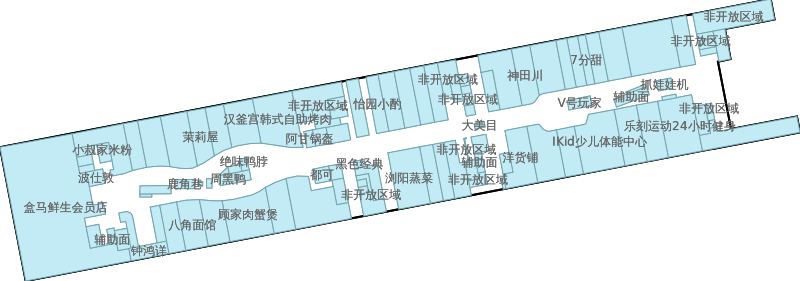

In [5]:
base = ".."
sample_site_path = "5d2709e003f801723c32d896_a9cc261267276e486328a30d"
# floor = result[sample_site_path]["floor"].iloc[0]
floor = "B1"
site = sample_site_path.split("_")[0]
floor_plan_filename = f'{base}/metadata/{site}/{floor}/floor_image.png'

pred_sample_data = result[sample_site_path].drop(["floor", "timestamp"], axis=1).reindex(columns=["x", "y"]).values


# Prepare width_meter & height_meter
json_plan_filename = f'{base}/metadata/{site}/{floor}/floor_info.json'
with open(json_plan_filename) as json_file:
    json_data = json.load(json_file)
    
width_meter = json_data["map_info"]["width"]
height_meter = json_data["map_info"]["height"]
title = "pred:"+sample_site_path

visualize_trajectory(trajectory = pred_sample_data,
                     floor_plan_filename = floor_plan_filename,
                     width_meter = width_meter,
                     height_meter = height_meter,
                     title = title
                    )



scaleは合っているが、とんでもない歩行になっている。


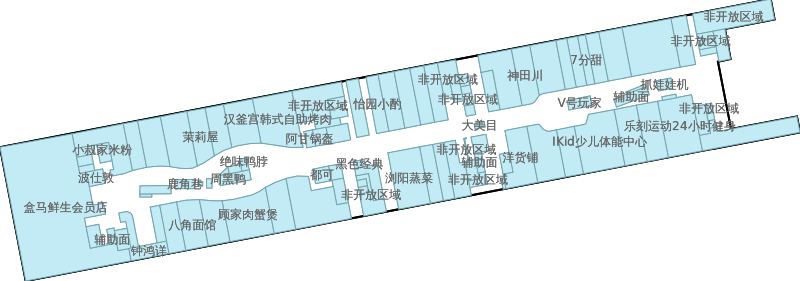

In [6]:
sample_real_path = glob.glob(f"{base}/train/{site}/{floor}/*.txt")[4]

# Read in a sample
sample_real_data = read_data_file(sample_real_path)

# Returns timestamp, x, y values
sample_real_trajectory = sample_real_data.waypoint
# Removes timestamp (we only need the coordinates)
sample_real_trajectory = sample_real_trajectory[:, 1:3]


visualize_trajectory(trajectory = sample_real_trajectory,
                     floor_plan_filename = floor_plan_filename,
                     width_meter = width_meter,
                     height_meter = height_meter,
                     title = title
                    )


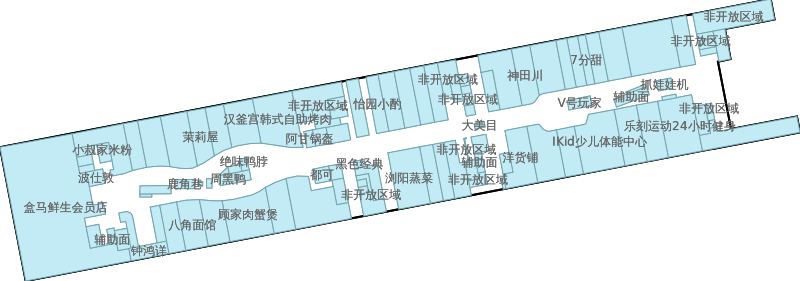

In [24]:
base = ".."
def visualize_result(site_path:str, result:dict, floor=None):
#     floor = result[sample_site_path]["floor"].iloc[0]
    data = result[sample_site_path].drop(["floor", "timestamp"], axis=1).reindex(columns=["x", "y"]).values
    site = site_path.split("_")[0]
    floor_plan_filename = f'{base}/metadata/{site}/{floor}/floor_image.png'
    
    json_plan_filename = f'{base}/metadata/{site}/{floor}/floor_info.json'
    with open(json_plan_filename) as json_file:
        json_data = json.load(json_file)

    width_meter = json_data["map_info"]["width"]
    height_meter = json_data["map_info"]["height"]
    title = "pred:"+sample_site_path

    return visualize_trajectory(trajectory = data,
                         floor_plan_filename = floor_plan_filename,
                         width_meter = width_meter,
                         height_meter = height_meter,
                         title = title
                        )

sample_site_path = "5d2709e003f801723c32d896_a9cc261267276e486328a30d"
visualize_result(sample_site_path, result, "B1")
# floor = "B1"






# Prepare width_meter & height_meter



In [8]:
result.keys()

dict_keys(['5da958dd46f8266d0737457b_491066b9356a9f968e04b09b', '5d2709bb03f801723c32852c_a403d556f6ebc1343e0b27ee', '5da958dd46f8266d0737457b_c0f79f21ad5f32c573f98886', '5d27096c03f801723c31e5e0_3f815bfeee94086f60be0d09', '5d27097f03f801723c320d97_b760d372b55d88f398110f48', '5d27096c03f801723c31e5e0_f31f1f8ec42e10d23cb54ec4', '5da1389e4db8ce0c98bd0547_446d199192f9d69464b77ffd', '5d2709b303f801723c327472_b2c1f3b0b84bae349a85a76f', '5d27096c03f801723c31e5e0_3fc0e68775cde4a5fce6cf2d', '5d2709c303f801723c3299ee_1892ff54553115169341d72e', '5da138b74db8ce0c98bd4774_3e1ba2182d077b7fd17d524f', '5d2709b303f801723c327472_c50cc8ab7c5008f50a38e70d', '5da138314db8ce0c98bbf3a0_0969b6db91bb1697f99a8a21', '5d2709d403f801723c32bd39_2de4f5fea373eb7b69a84824', '5d27097f03f801723c320d97_b7deb644d3ec40fb81cad6e2', '5da138764db8ce0c98bcaa46_0dbf956c380feddc590348e0', '5d2709bb03f801723c32852c_bb8d876705a0d8b453791035', '5da958dd46f8266d0737457b_66744e8a5c65a748497cd7c0', '5d27096c03f801723c31e5e0_2db317d88

show floor 1



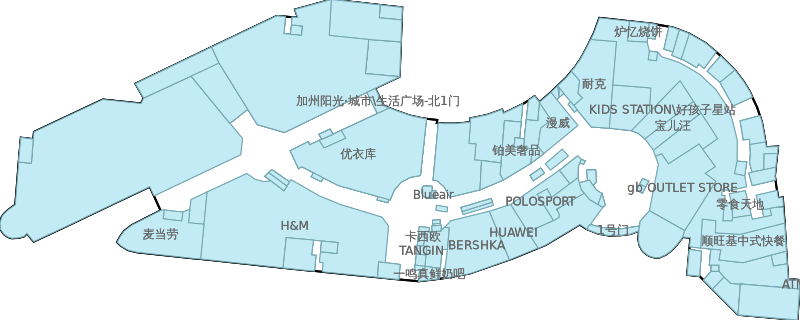

In [25]:
sample_site_path = "5da138754db8ce0c98bca82f_852fb29bb4996d022496edcc"
print(f"show floor {result[sample_site_path]['floor'].iloc[0]}")
fig = visualize_result(sample_site_path, result, "F1")
fig.show()


show floor 3



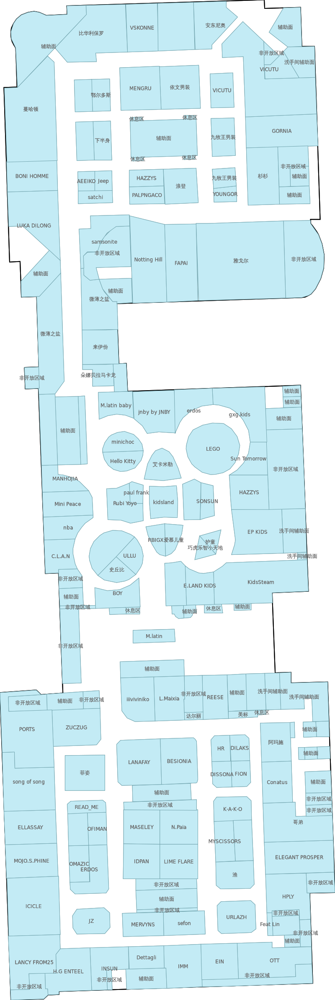

In [26]:
sample_site_path = "5d2709c303f801723c3299ee_46c865d487fa011022507710"
print(f"show floor {result[sample_site_path]['floor'].iloc[0]}")
fig = visualize_result(sample_site_path, result, "3F")
fig.show()


In [27]:
suspects = []
for k in result.keys():
    k_data = k.split("_")
    if k_data[0] == '5d27097f03f801723c320d97':
        print(k_data)
        suspects.append(k_data[1])


['5d27097f03f801723c320d97', 'b760d372b55d88f398110f48']
['5d27097f03f801723c320d97', 'b7deb644d3ec40fb81cad6e2']
['5d27097f03f801723c320d97', 'a25f020b7571d262ff5952ed']
['5d27097f03f801723c320d97', 'cf505e00f50df4548ef98d05']
['5d27097f03f801723c320d97', 'd712536c776ed08ddfcb73c6']
['5d27097f03f801723c320d97', '4fbd93217986b45372ebedd4']
['5d27097f03f801723c320d97', 'ea6f61a237dc4e79b251422a']
['5d27097f03f801723c320d97', '7727672abec7d70216173223']
['5d27097f03f801723c320d97', 'a606cb39b74b8e0d45c8c8b8']
['5d27097f03f801723c320d97', '9dedc3819b9ac8444b1f30f4']
['5d27097f03f801723c320d97', 'e8c5c09da1a03d6a980ebf8c']
['5d27097f03f801723c320d97', '500913fc93d997b6803dd6df']
['5d27097f03f801723c320d97', '2fed60cb00f71d86ef78b5b4']
['5d27097f03f801723c320d97', 'bb73ec8779aaa0509bea454a']
['5d27097f03f801723c320d97', '698dc1d1a1885908e8fbfe4c']
['5d27097f03f801723c320d97', 'bf5543efb9497b2dd44ca7da']
['5d27097f03f801723c320d97', '18ab7e85351d03d1cd691a73']


show floor 2



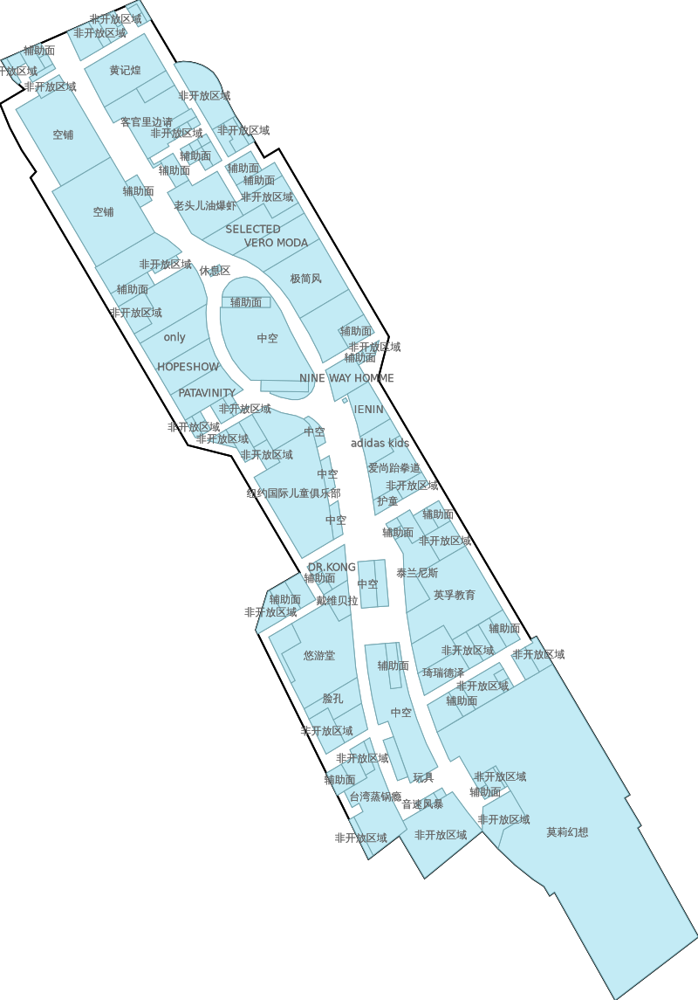

In [28]:

sample_site_path = f"5d27097f03f801723c320d97_{suspects[0]}"
print(f"show floor {result[sample_site_path]['floor'].iloc[0]}")
fig = visualize_result(sample_site_path, result, "F3")
fig.show()


show floor 2



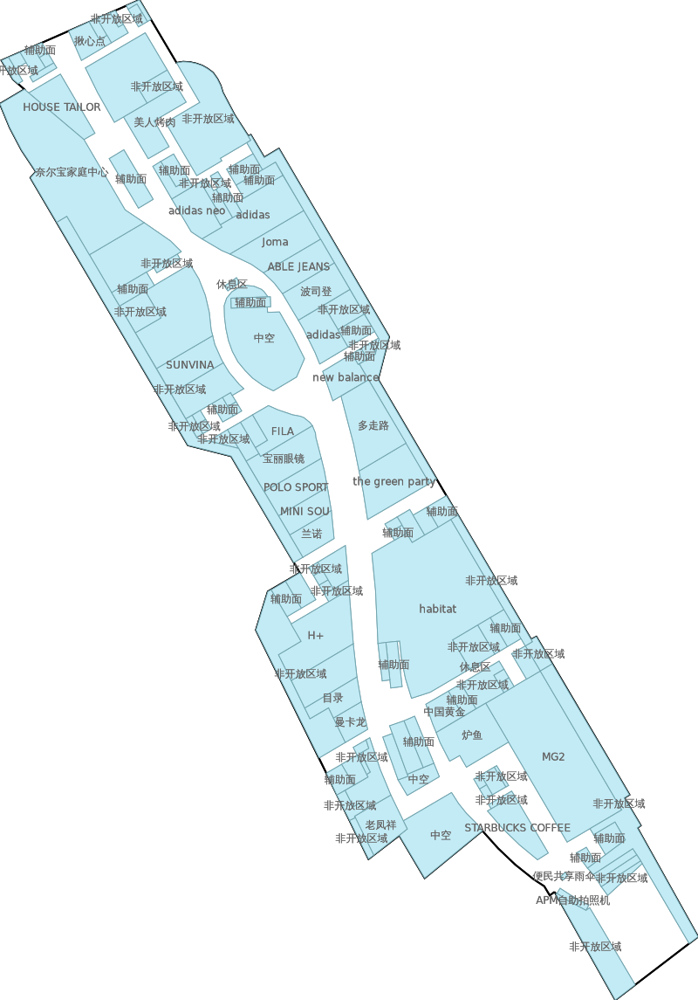

In [29]:

sample_site_path = f"5d27097f03f801723c320d97_{suspects[1]}"
print(f"show floor {result[sample_site_path]['floor'].iloc[1]}")
fig = visualize_result(sample_site_path, result, "F2")
fig.show()


show floor 2



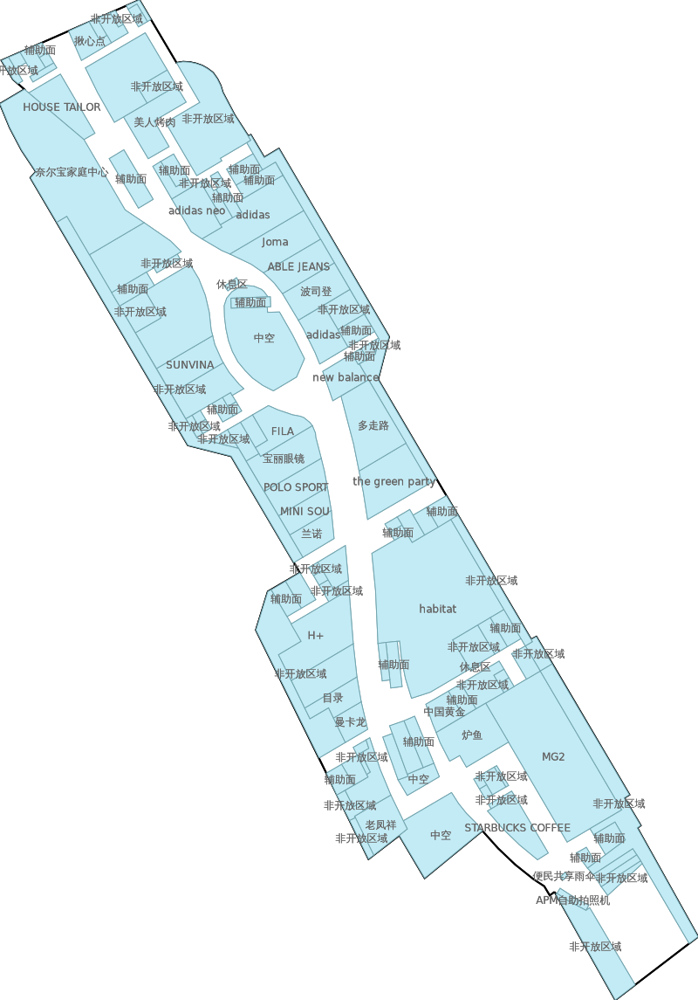

In [30]:

sample_site_path = f"5d27097f03f801723c320d97_{suspects[2]}"
print(f"show floor {result[sample_site_path]['floor'].iloc[2]}")
fig = visualize_result(sample_site_path, result, "F2")
fig.show()


show floor 3



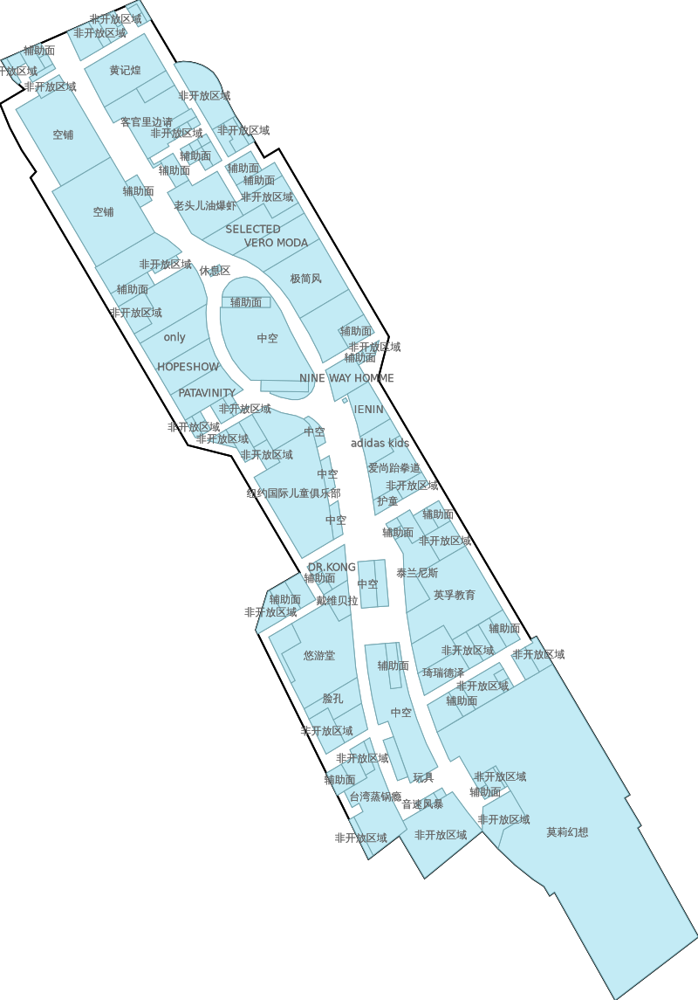

In [31]:

sample_site_path = f"5d27097f03f801723c320d97_{suspects[3]}"
print(f"show floor {result[sample_site_path]['floor'].iloc[3]}")
fig = visualize_result(sample_site_path, result, "F3")
fig.show()


show floor 2



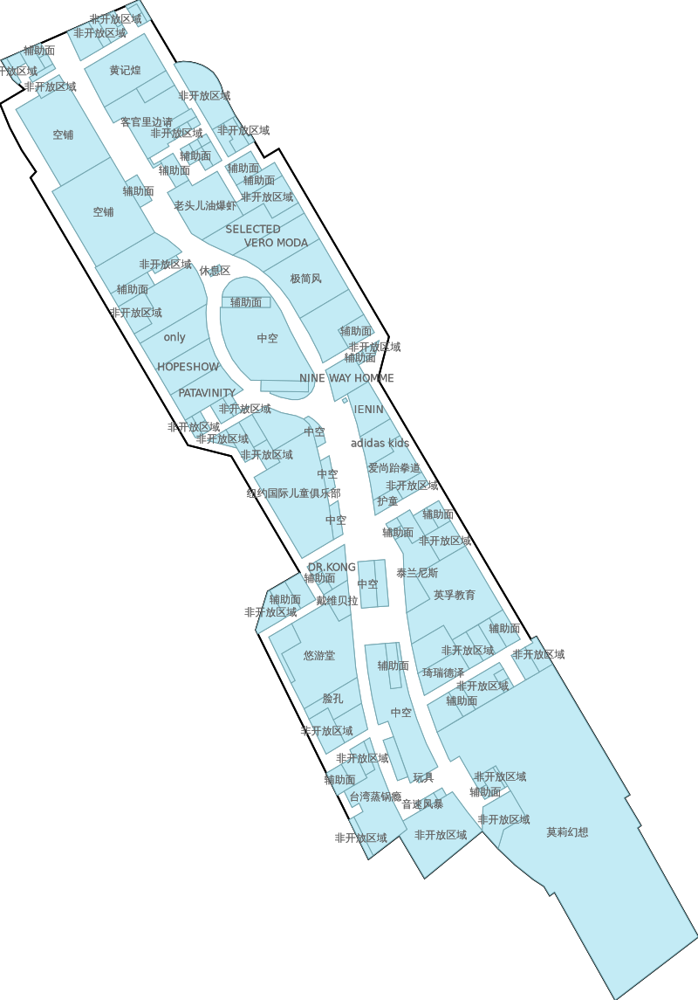

In [32]:

sample_site_path = f"5d27097f03f801723c320d97_{suspects[4]}"
print(f"show floor {result[sample_site_path]['floor'].iloc[4]}")
fig = visualize_result(sample_site_path, result, "F3")
fig.show()


show floor 2



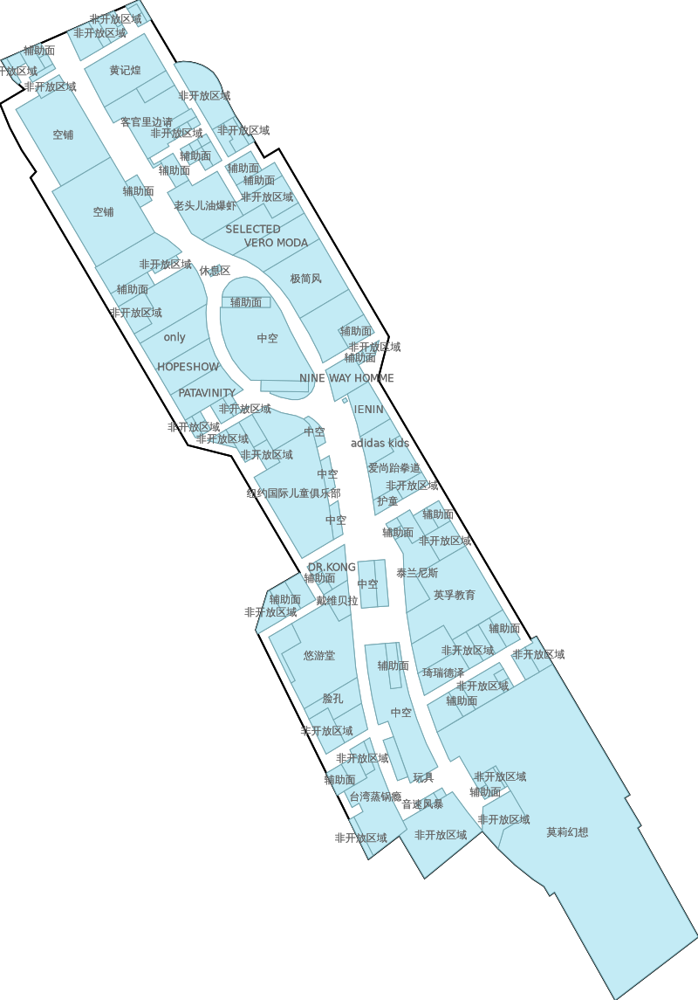

In [33]:

sample_site_path = f"5d27097f03f801723c320d97_{suspects[4]}"
print(f"show floor {result[sample_site_path]['floor'].iloc[4]}")
fig = visualize_result(sample_site_path, result, "F3")
fig.show()


show floor 1



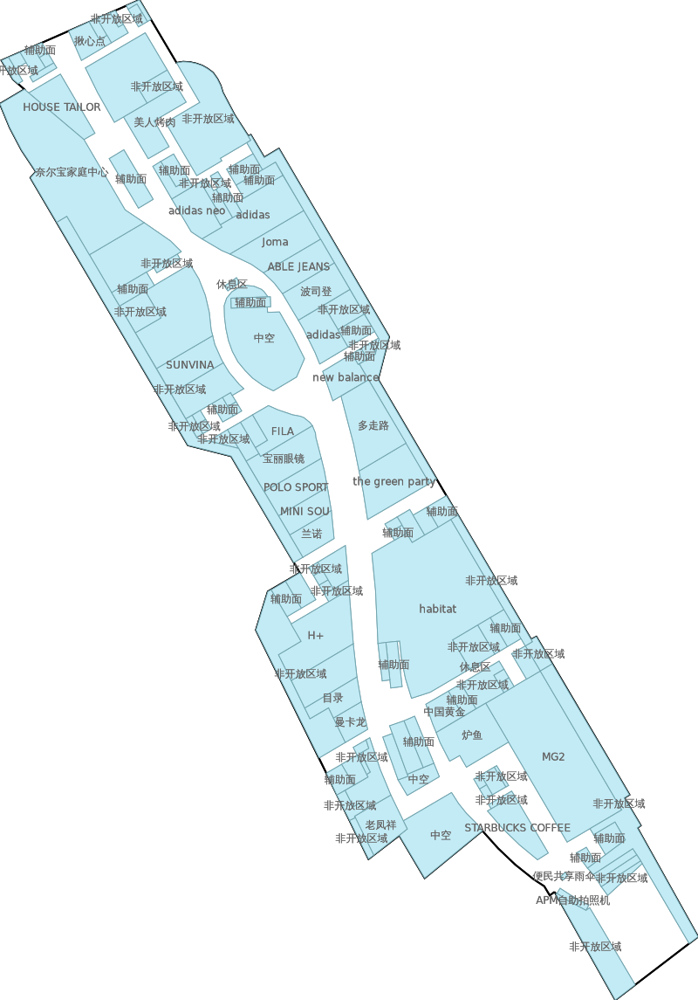

In [34]:

sample_site_path = f"5d27097f03f801723c320d97_{suspects[5]}"
print(f"show floor {result[sample_site_path]['floor'].iloc[5]}")
fig = visualize_result(sample_site_path, result, "F2")
fig.show()


show floor 2



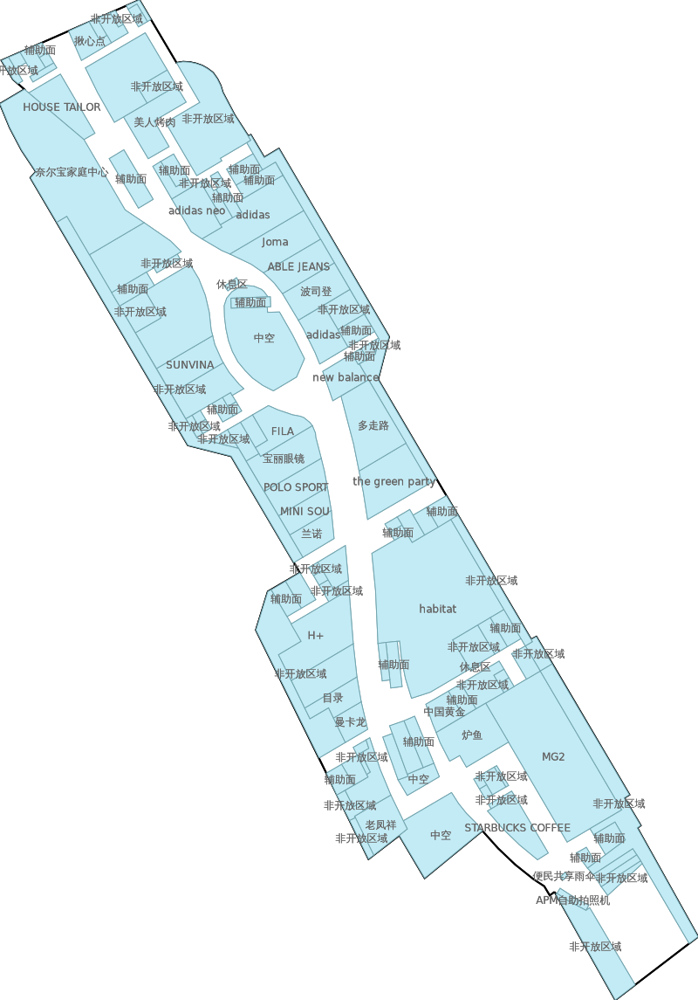

In [35]:

sample_site_path = f"5d27097f03f801723c320d97_{suspects[6]}"
print(f"show floor {result[sample_site_path]['floor'].iloc[6]}")
fig = visualize_result(sample_site_path, result, "F2")
fig.show()


show floor -2



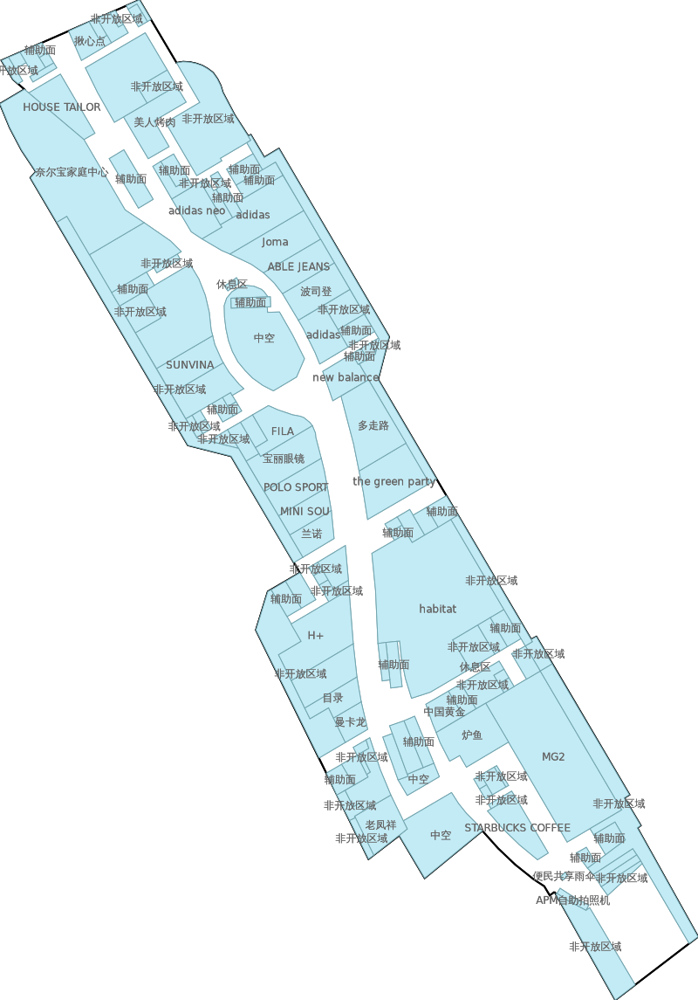

In [36]:

sample_site_path = f"5d27097f03f801723c320d97_{suspects[7]}"
print(f"show floor {result[sample_site_path]['floor'].iloc[7]}")
fig = visualize_result(sample_site_path, result, "F2")
fig.show()


show floor -2



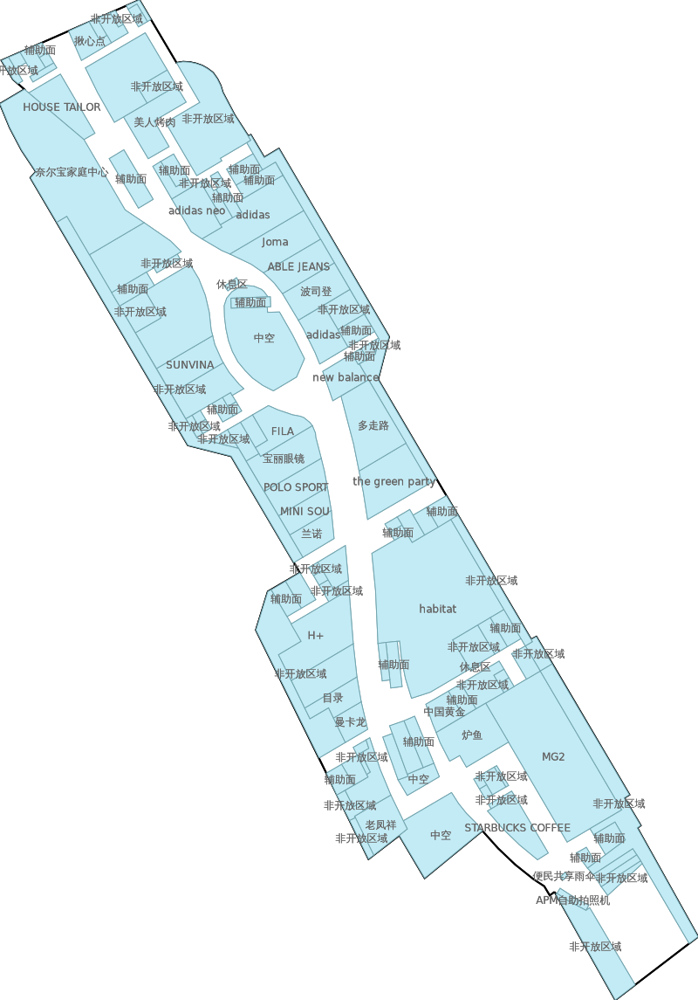

show floor 4



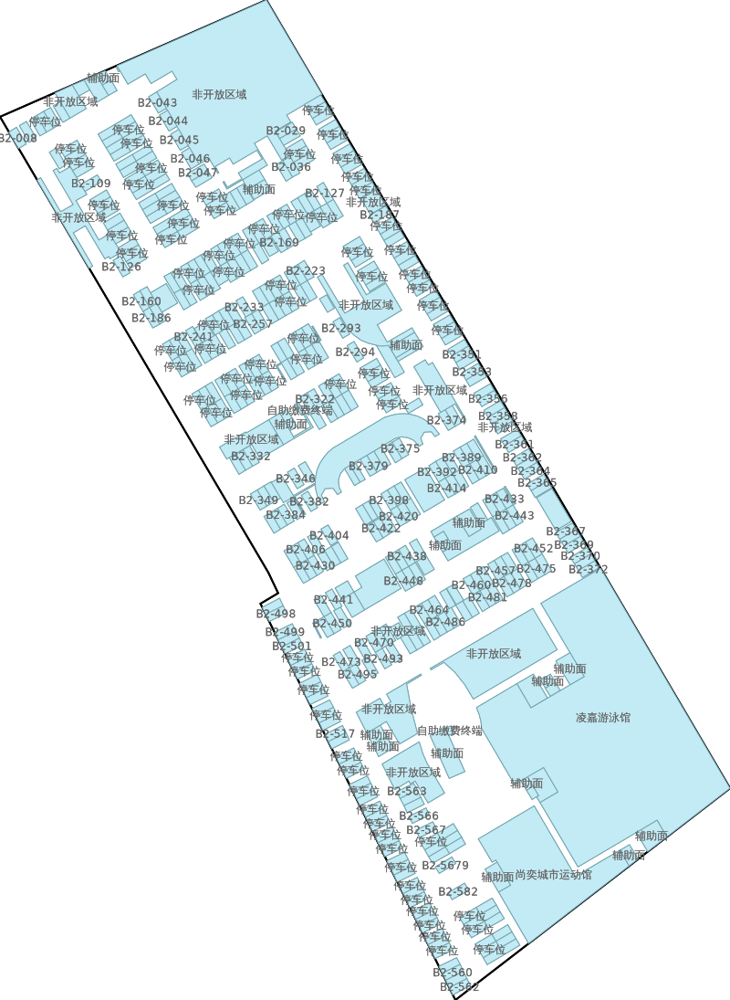

show floor 3



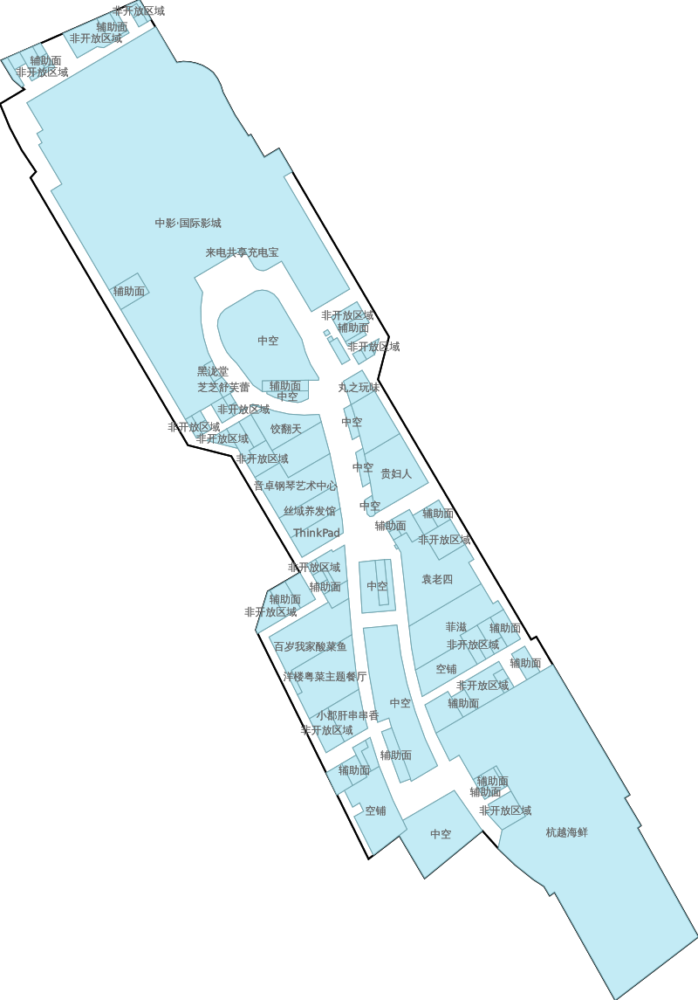

show floor 3



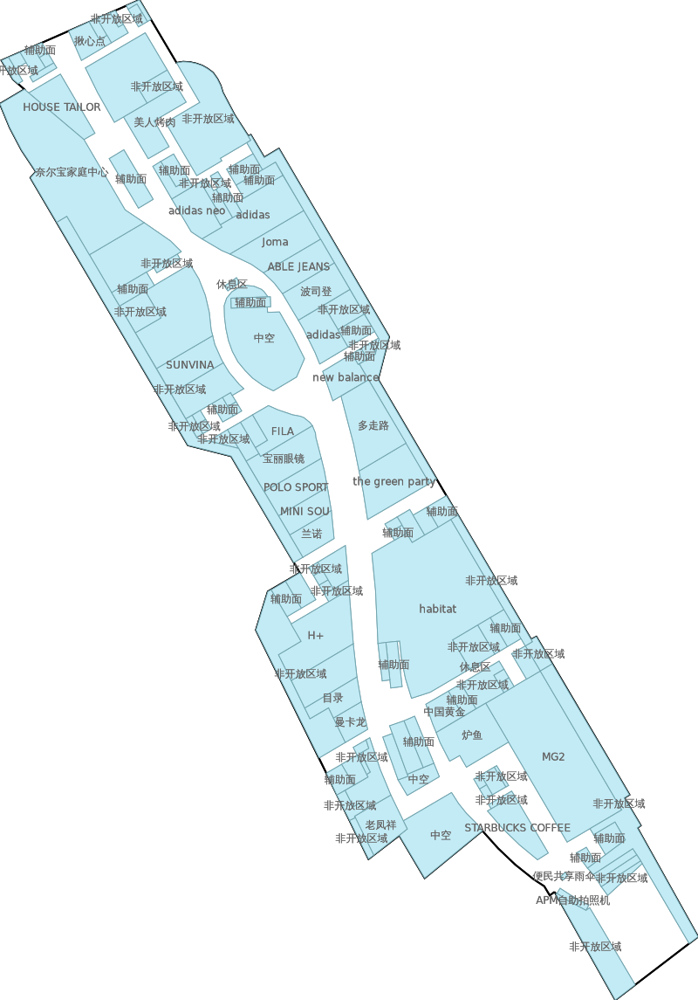

show floor 2



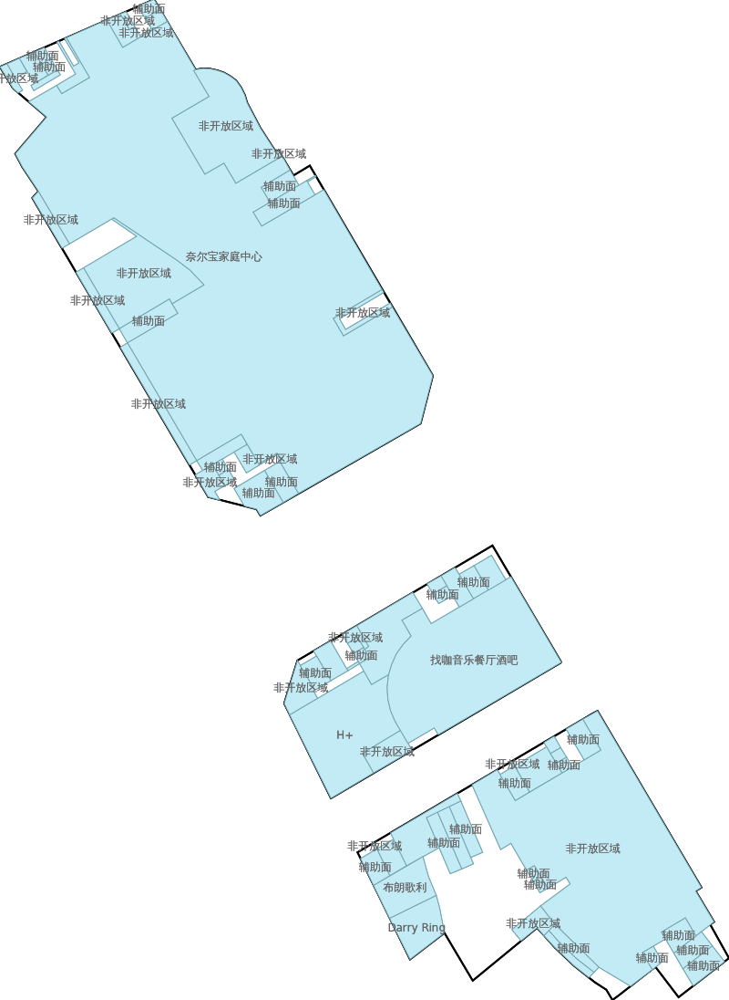

show floor 3



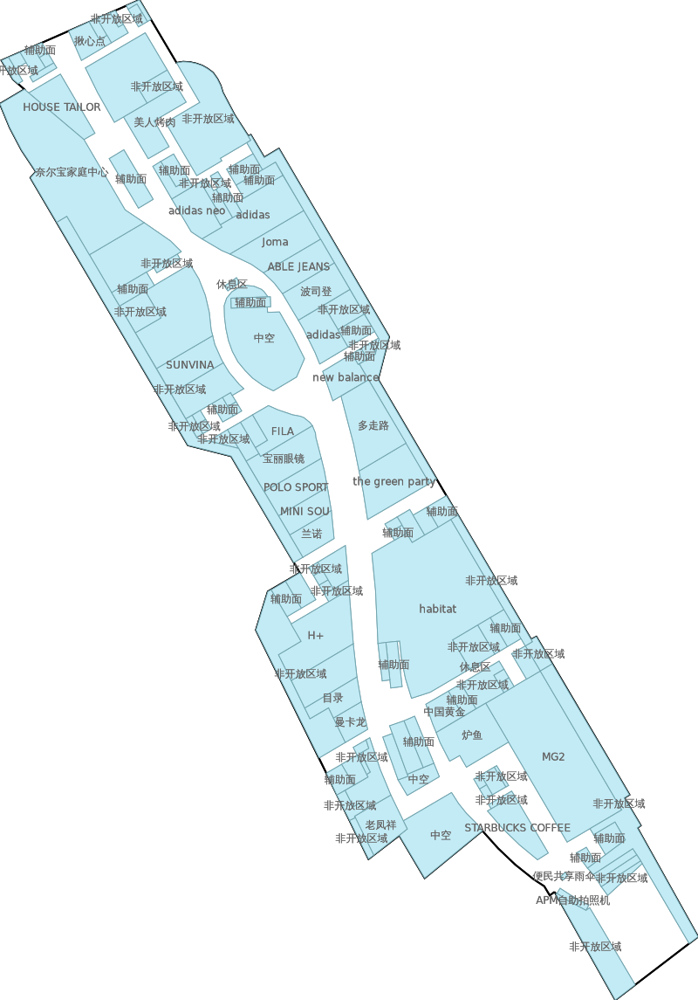

show floor 2



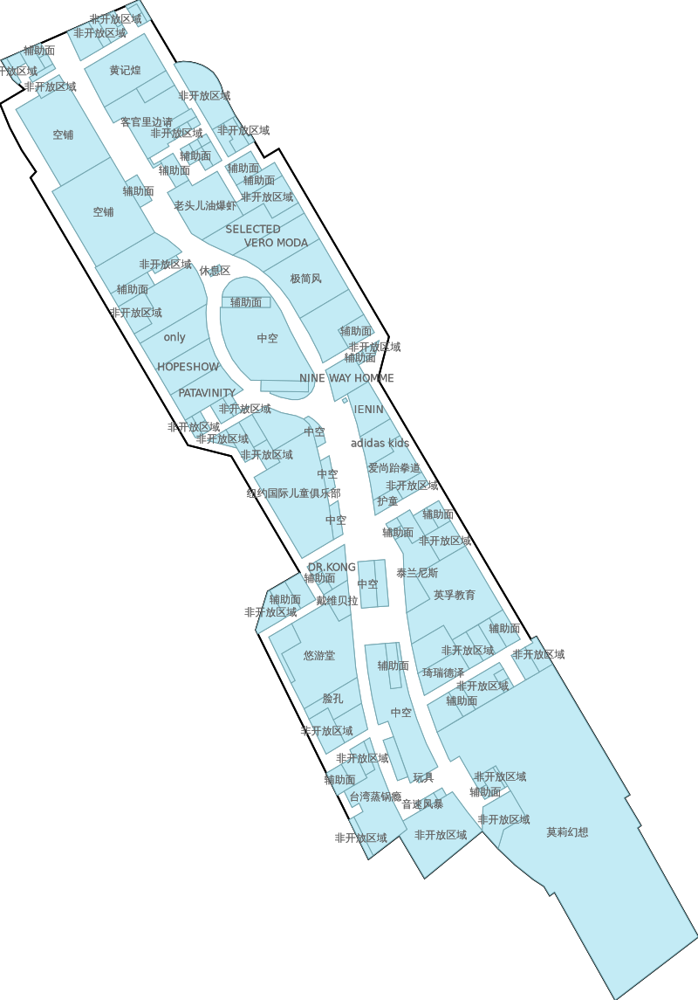

show floor -2



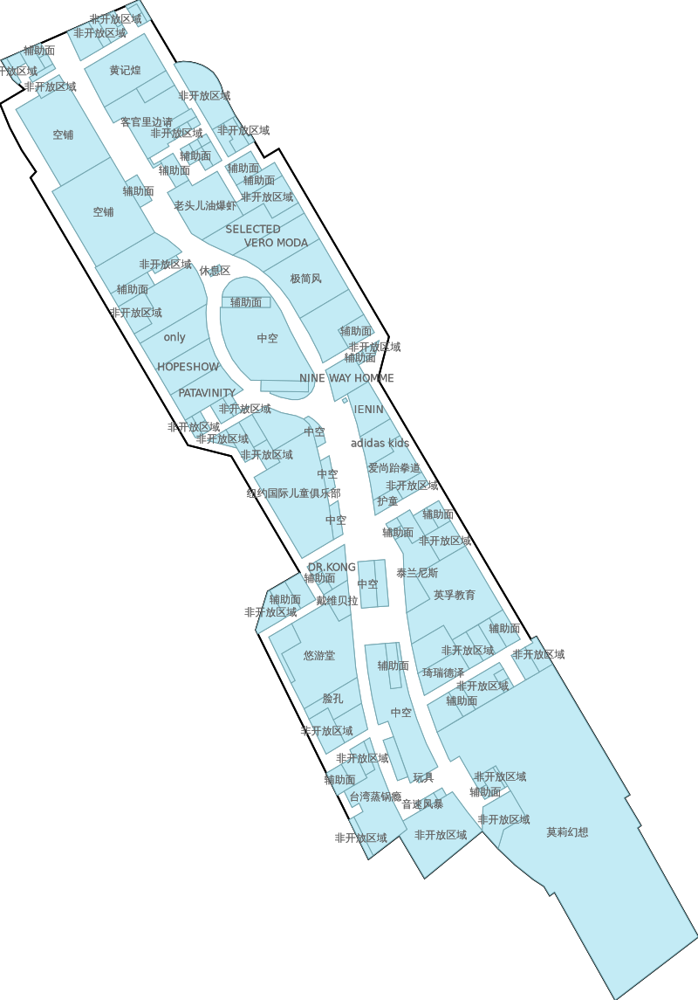

show floor 3



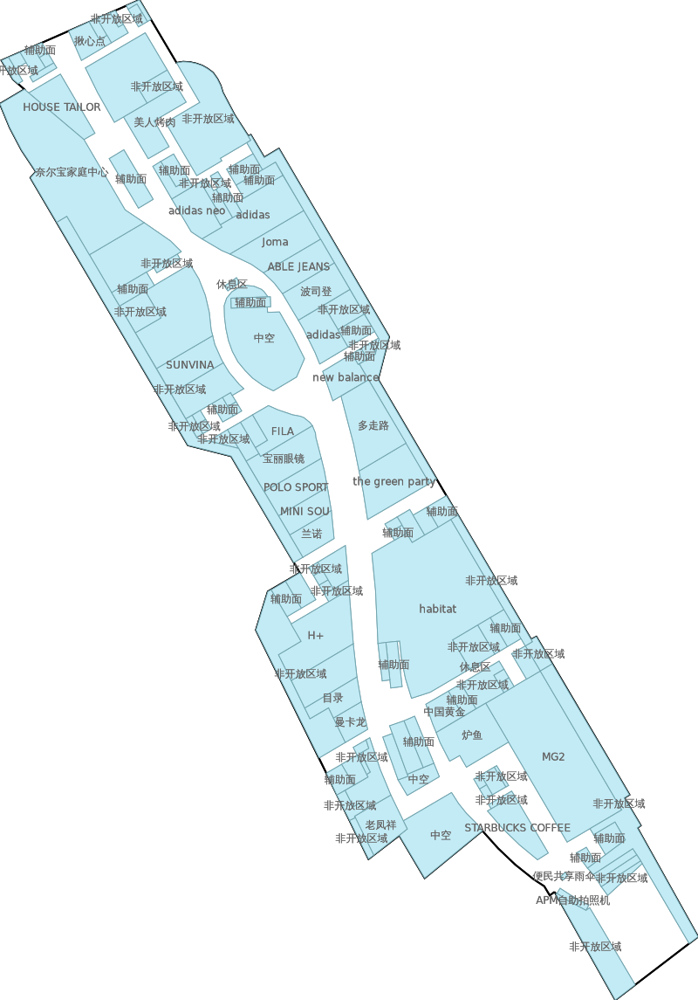

show floor 3



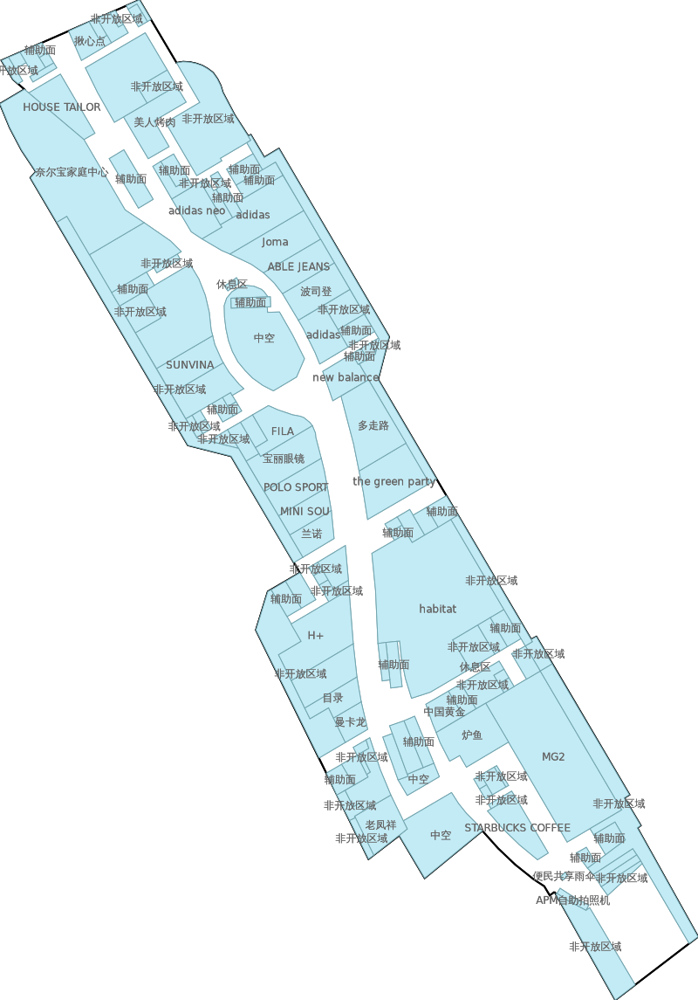

In [37]:

sample_site_path = f"5d27097f03f801723c320d97_{suspects[7]}"
print(f"show floor {result[sample_site_path]['floor'].iloc[0]}")
fig = visualize_result(sample_site_path, result, "F2")
fig.show()


sample_site_path = f"5d27097f03f801723c320d97_{suspects[8]}"
print(f"show floor {result[sample_site_path]['floor'].iloc[0]}")
fig = visualize_result(sample_site_path, result, "B2")
fig.show()


sample_site_path = f"5d27097f03f801723c320d97_{suspects[9]}"
print(f"show floor {result[sample_site_path]['floor'].iloc[0]}")
fig = visualize_result(sample_site_path, result, "F4")
fig.show()


sample_site_path = f"5d27097f03f801723c320d97_{suspects[10]}"
print(f"show floor {result[sample_site_path]['floor'].iloc[0]}")
fig = visualize_result(sample_site_path, result, "F2")
fig.show()


sample_site_path = f"5d27097f03f801723c320d97_{suspects[11]}"
print(f"show floor {result[sample_site_path]['floor'].iloc[0]}")
fig = visualize_result(sample_site_path, result, "F1")
fig.show()


sample_site_path = f"5d27097f03f801723c320d97_{suspects[12]}"
print(f"show floor {result[sample_site_path]['floor'].iloc[0]}")
fig = visualize_result(sample_site_path, result, "F2")
fig.show()


sample_site_path = f"5d27097f03f801723c320d97_{suspects[13]}"
print(f"show floor {result[sample_site_path]['floor'].iloc[0]}")
fig = visualize_result(sample_site_path, result, "F3")
fig.show()


sample_site_path = f"5d27097f03f801723c320d97_{suspects[14]}"
print(f"show floor {result[sample_site_path]['floor'].iloc[0]}")
fig = visualize_result(sample_site_path, result, "F3")
fig.show()

sample_site_path = f"5d27097f03f801723c320d97_{suspects[15]}"
print(f"show floor {result[sample_site_path]['floor'].iloc[0]}")
fig = visualize_result(sample_site_path, result, "F2")
fig.show()

sample_site_path = f"5d27097f03f801723c320d97_{suspects[16]}"
print(f"show floor {result[sample_site_path]['floor'].iloc[0]}")
fig = visualize_result(sample_site_path, result, "F2")
fig.show()



In [38]:
result[sample_site_path]['floor']

1026    3
1027    3
1028    3
1029    3
1030    3
1031    3
1032    3
1033    3
1034    3
1035    3
1036    3
1037    3
1038    3
1039    3
1040    3
1041    3
1042    3
1043    3
1044    3
1045    3
Name: floor, dtype: int64